In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt

from matplotlib.pyplot import figure
plt.style.use('ggplot')

%matplotlib inline
matplotlib.rcParams['figure.figsize']=(12,8)

In [2]:
df=pd.read_csv('movies.csv')
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [3]:
#look for missing data 

for col in df.columns:
    missing=np.mean(df[col].isnull())
    print('{} - {}%'.format(col,missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [4]:
df.columns.isnull()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [5]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [6]:
df.shape

(7668, 15)

In [7]:
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [22]:
gross=np.mean(df['gross'])
budget=np.mean(df['budget'])
votes=np.mean(df['votes'])

df["budget"].fillna(budget, inplace = True)
df["gross"].fillna(gross, inplace = True)
df['votes'].fillna(votes,inplace=True)

In [23]:
df.isnull().sum()

name              0
rating            0
genre             0
year              0
released          0
score             0
votes             0
director          0
writer            0
star              0
country           0
budget            0
gross             0
company           0
runtime           0
year_corrected    0
dtype: int64

In [24]:
df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')
df['votes']=df['votes'].astype('int64')

In [25]:
df.shape

(7574, 16)

In [26]:
df.dropna(inplace=True)

In [27]:
df.isnull().sum()

name              0
rating            0
genre             0
year              0
released          0
score             0
votes             0
director          0
writer            0
star              0
country           0
budget            0
gross             0
company           0
runtime           0
year_corrected    0
dtype: int64

In [28]:
df.shape

(7574, 16)

In [29]:
df.dtypes

name               object
rating             object
genre              object
year                int64
released           object
score             float64
votes               int64
director           object
writer             object
star               object
country            object
budget              int64
gross               int64
company            object
runtime           float64
year_corrected     object
dtype: object

In [30]:
df=df.reset_index(drop=True)

In [31]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_corrected
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7569,The Eight Hundred,Not Rated,Action,2020,"August 28, 2020 (United States)",6.8,3700,Hu Guan,Hu Guan,Zhi-zhong Huang,China,80000000,461421559,Beijing Diqi Yinxiang Entertainment,149.0,2020
7570,The Quarry,R,Crime,2020,"April 17, 2020 (Mexico)",5.4,2400,Scott Teems,Scott Teems,Shea Whigham,United States,35589876,3661,Prowess Pictures,98.0,2020
7571,Tulsa,PG-13,Comedy,2020,"June 3, 2020 (United States)",5.0,294,Scott Pryor,Scott Pryor,Scott Pryor,United States,35589876,413378,Pryor Entertainment,120.0,2020
7572,Black Wall Street Burning,R,Drama,2020,"February 7, 2020 (United States)",6.6,35,Marcus Brown,Dekoven Riggins,Dan Belcher,United States,5000,78500541,Notis Studio,78.0,2020


In [32]:
df['year_corrected'] = df['released'].str.extract(r'\b(\d{4})\b')

In [33]:
"""
def extract_year(date_str):
    date_parts = date_str.split('(')[0].strip().split(' ')
    year = date_parts[-1]
    return year

df['year'] = df['released'].apply(extract_year)
"""

"\ndef extract_year(date_str):\n    date_parts = date_str.split('(')[0].strip().split(' ')\n    year = date_parts[-1]\n    return year\n\ndf['year'] = df['released'].apply(extract_year)\n"

In [34]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_corrected
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7569,The Eight Hundred,Not Rated,Action,2020,"August 28, 2020 (United States)",6.8,3700,Hu Guan,Hu Guan,Zhi-zhong Huang,China,80000000,461421559,Beijing Diqi Yinxiang Entertainment,149.0,2020
7570,The Quarry,R,Crime,2020,"April 17, 2020 (Mexico)",5.4,2400,Scott Teems,Scott Teems,Shea Whigham,United States,35589876,3661,Prowess Pictures,98.0,2020
7571,Tulsa,PG-13,Comedy,2020,"June 3, 2020 (United States)",5.0,294,Scott Pryor,Scott Pryor,Scott Pryor,United States,35589876,413378,Pryor Entertainment,120.0,2020
7572,Black Wall Street Burning,R,Drama,2020,"February 7, 2020 (United States)",6.6,35,Marcus Brown,Dekoven Riggins,Dan Belcher,United States,5000,78500541,Notis Studio,78.0,2020


In [35]:
df['year_corrected'].unique()

array(['1980', '1981', '1984', '1983', '1982', '1992', '1987', '1985',
       '1986', '1988', '1990', '1989', '2008', '1991', '1993', '1999',
       '2016', '1997', '1994', '1995', '2019', '1996', '2001', '2000',
       '1998', '2014', '2002', '2003', '2005', '2004', '2006', '2007',
       '2010', '2011', '2009', '2013', '2015', '2012', '2017', '2018',
       '2020'], dtype=object)

In [36]:
df.head(20)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_corrected
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


In [37]:
pd.set_option('display.max_rows',None)

In [38]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_corrected
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


In [42]:
#see the distinct company names
df['company'].drop_duplicates().sort_values(ascending=False)

7066                                              thefyzz
5609                                          micro_scope
6353                             iDeal Partners Film Fund
3957                                             i5 Films
6733                                           i am OTHER
6361                                                 erbp
3733                                       double A Films
515                             Zupnik-Curtis Enterprises
3291                          Zucker Brothers Productions
143                                      Zoetrope Studios
2182                                   Zeta Entertainment
6163                        Zentropa International Norway
3655                              Zentropa Entertainments
526                                  Zenith Entertainment
5126                                      Zazen Produções
3154                                          ZapPictures
1302                             Zanuck/Brown Productions
1310          

In [46]:
df.describe()

,year,score,votes,budget,gross,runtime
count,7574.000000,7574.000000,7.574000e+03,7.574000e+03,7.574000e+03,7574.000000
mean,2000.377079,6.389345,8.894074e+04,3.568138e+07,7.898301e+07,107.291128
std,11.108858,0.968411,1.640419e+05,3.527040e+07,1.644290e+08,18.584716
min,1980.000000,1.900000,3.500000e+01,3.000000e+03,3.090000e+02,63.000000
25%,1991.000000,5.800000,9.400000e+03,1.400000e+07,4.843455e+06,95.000000
50%,2000.000000,6.500000,3.300000e+04,3.558988e+07,2.151214e+07,104.000000
75%,2010.000000,7.100000,9.400000e+04,3.558988e+07,7.850054e+07,116.000000
max,2020.000000,9.300000,2.400000e+06,3.560000e+08,2.847246e+09,366.000000


Text(0, 0.5, 'gross')

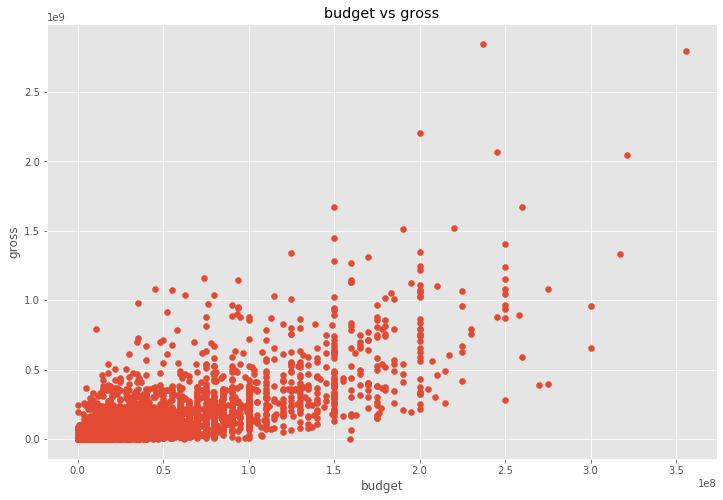

In [54]:
#scatter plot of budget vs gross
plt.scatter(x=df['budget'], y=df['gross'])
plt.title('budget vs gross')
plt.xlabel('budget')
plt.ylabel('gross')

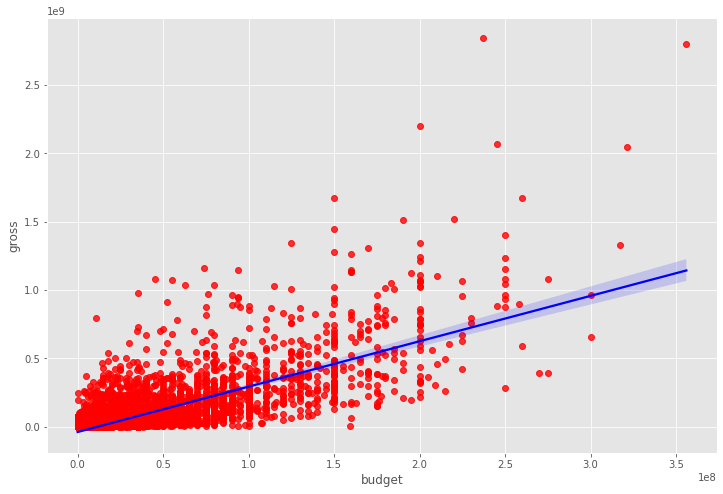

In [59]:
#plot budget vs gross using seaborn

sns.regplot(x='budget',y='gross',data=df,scatter_kws={'color':'red'},line_kws={'color':'blue'})

In [65]:
#lets start looking at correlation

correlation_matrix=df.corr(method='pearson')
correlation_matrix

,year,score,votes,budget,gross,runtime
year,1.000000,0.102346,0.226895,0.269153,0.254266,0.120676
score,0.102346,1.000000,0.411931,0.064682,0.185063,0.400574
votes,0.226895,0.411931,1.000000,0.421252,0.629322,0.309366
budget,0.269153,0.064682,0.421252,1.000000,0.712614,0.266056
gross,0.254266,0.185063,0.629322,0.712614,1.000000,0.241628
runtime,0.120676,0.400574,0.309366,0.266056,0.241628,1.000000


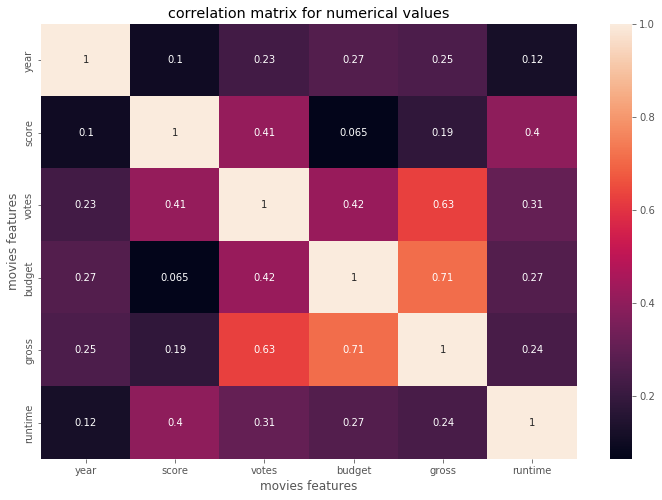

In [68]:
sns.heatmap(correlation_matrix,annot=True)
plt.title('correlation matrix for numerical values')
plt.xlabel('movies features')
plt.ylabel('movies features')
plt.show()

In [69]:
#convert numerical data
df_numerized = df


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_corrected
0,6506,6,6,1980,1685,8.4,927000,2544,3958,1022,54,19000000,46998772,2273,146.0,0
1,5498,6,1,1980,1472,5.8,65000,2233,1612,316,55,4500000,58853106,710,104.0,0
2,5073,4,0,1980,1751,8.7,1200000,1093,2534,1708,55,18000000,538375067,1505,124.0,0
3,282,4,4,1980,1472,7.7,221000,1279,1975,2197,55,3500000,83453539,1769,88.0,0
4,1016,6,4,1980,1523,7.3,108000,1037,511,398,55,6000000,39846344,1736,98.0,0
5,2088,6,9,1980,2474,6.4,123000,2486,4304,234,55,550000,39754601,1769,95.0,0
6,5499,6,0,1980,1751,7.9,188000,1390,821,1250,55,27000000,115229890,2236,133.0,0
7,4374,6,3,1980,691,8.2,330000,1799,1747,2191,55,18000000,23402427,612,129.0,0
8,5210,4,0,1980,1733,6.8,101000,2267,1955,855,55,54000000,108185706,861,127.0,1
9,6133,6,3,1980,2260,7.0,10000,2816,413,572,55,10000000,15795189,2227,100.0,0


In [70]:
correlation_mat=df_numerized.corr()
corr_pairs=correlation_mat.unstack()
corr_pairs

name            name              1.000000
                rating           -0.011924
                genre             0.015300
                year              0.013514
                released         -0.009906
                score             0.016181
                votes             0.013180
                director          0.009608
                writer            0.010217
                star              0.005685
                country          -0.009939
                budget            0.020930
                gross             0.005076
                company           0.010073
                runtime           0.011151
                year_corrected    0.012711
rating          name             -0.011924
                rating            1.000000
                genre             0.117566
                year              0.024989
                released          0.024319
                score             0.011538
                votes             0.016086
           

In [72]:
sorted_pairs=corr_pairs.sort_values()
sorted_pairs

genre           budget           -0.316752
budget          genre            -0.316752
genre           gross            -0.238328
gross           genre            -0.238328
rating          budget           -0.156307
budget          rating           -0.156307
votes           genre            -0.148420
genre           votes            -0.148420
country         score            -0.130094
score           country          -0.130094
rating          gross            -0.129394
gross           rating           -0.129394
genre           year             -0.088172
year            genre            -0.088172
year_corrected  genre            -0.084559
genre           year_corrected   -0.084559
country         runtime          -0.081464
runtime         country          -0.081464
country         year_corrected   -0.080397
year_corrected  country          -0.080397
rating          company          -0.076807
company         rating           -0.076807
country         year             -0.070266
year       

In [74]:
high_corr=sorted_pairs[sorted_pairs>0.5]
high_corr

gross           votes             0.629322
votes           gross             0.629322
budget          gross             0.712614
gross           budget            0.712614
year_corrected  year              0.997466
year            year_corrected    0.997466
name            name              1.000000
company         company           1.000000
gross           gross             1.000000
budget          budget            1.000000
country         country           1.000000
star            star              1.000000
writer          writer            1.000000
director        director          1.000000
votes           votes             1.000000
score           score             1.000000
released        released          1.000000
year            year              1.000000
genre           genre             1.000000
rating          rating            1.000000
runtime         runtime           1.000000
year_corrected  year_corrected    1.000000
dtype: float64

In [ ]:
# votes and budget have highest correlation to gross earnings